## Etapa 1 - Importando as bibliotecas

In [ ]:
#importando as bibliotecas necessárias

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import zipfile

cv2.__version__

'3.4.3'

In [ ]:
%tensorflow_version 2.x
import tensorflow
tensorflow.__version__

TensorFlow 2.x selected.


'2.0.0'

## Etapa 2 - Conectando com o Drive e acessando os arquivos

In [ ]:
#conectando com o google drive

from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [ ]:
#extraindo os arquivos do .zip

path = "/content/gdrive/My Drive/Material.zip"
zip_object = zipfile.ZipFile(file=path, mode="r")
zip_object.extractall("./")

In [ ]:
#extraindo os arquivos do .zip

base_imgs = 'Material/fer2013.zip'
zip_object = zipfile.ZipFile(file = base_imgs, mode = 'r')
zip_object.extractall('./')
zip_object.close

<bound method ZipFile.close of <zipfile.ZipFile filename='Material/fer2013.zip' mode='r'>>

## Etapa 3 - Acessando a base com fotos de expressões faciais



In [ ]:
#transformando o arquivo csv num dataframe pandas

data = pd.read_csv('fer2013/fer2013.csv')
data.tail()

,emotion,pixels,Usage
35882,6,50 36 17 22 23 29 33 39 34 37 37 37 39 43 48 5...,PrivateTest
35883,3,178 174 172 173 181 188 191 194 196 199 200 20...,PrivateTest
35884,0,17 17 16 23 28 22 19 17 25 26 20 24 31 19 27 9...,PrivateTest
35885,3,30 28 28 29 31 30 42 68 79 81 77 67 67 71 63 6...,PrivateTest
35886,2,19 13 14 12 13 16 21 33 50 57 71 84 97 108 122...,PrivateTest


Text(0.5, 1.0, 'Imagens x emoções')

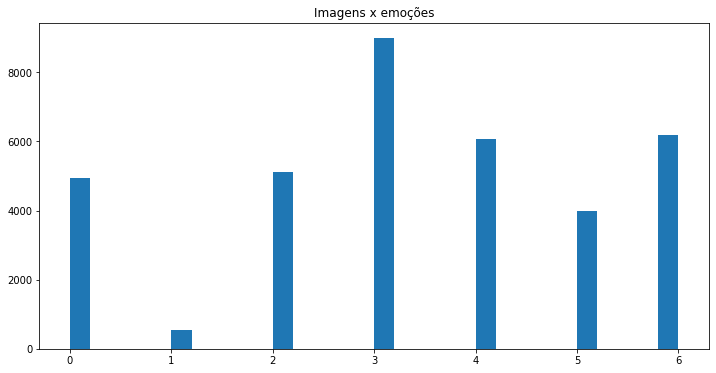

In [ ]:
#plotando imagens x emoções

plt.figure(figsize=(12,6))
plt.hist(data['emotion'], bins = 30)
plt.title('Imagens x emoções')

# Classes: ['Angry', 'Disgust', 'Fear', 'Happy', 'Sad', 'Surprise', 'Neutral']

## Etapa 4 - Pré-processamento

In [ ]:
#convertendo todas as linhas da coluna pixels para listas

pixels = data['pixels'].tolist()
pixels

['70 80 82 72 58 58 60 63 54 58 60 48 89 115 121 119 115 110 98 91 84 84 90 99 110 126 143 153 158 171 169 172 169 165 129 110 113 107 95 79 66 62 56 57 61 52 43 41 65 61 58 57 56 69 75 70 65 56 54 105 146 154 151 151 155 155 150 147 147 148 152 158 164 172 177 182 186 189 188 190 188 180 167 116 95 103 97 77 72 62 55 58 54 56 52 44 50 43 54 64 63 71 68 64 52 66 119 156 161 164 163 164 167 168 170 174 175 176 178 179 183 187 190 195 197 198 197 198 195 191 190 145 86 100 90 65 57 60 54 51 41 49 56 47 38 44 63 55 46 52 54 55 83 138 157 158 165 168 172 171 173 176 179 179 180 182 185 187 189 189 192 197 200 199 196 198 200 198 197 177 91 87 96 58 58 59 51 42 37 41 47 45 37 35 36 30 41 47 59 94 141 159 161 161 164 170 171 172 176 178 179 182 183 183 187 189 192 192 194 195 200 200 199 199 200 201 197 193 111 71 108 69 55 61 51 42 43 56 54 44 24 29 31 45 61 72 100 136 150 159 163 162 163 170 172 171 174 177 177 180 187 186 187 189 192 192 194 195 196 197 199 200 201 200 197 201 137 58 98 9

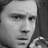

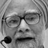

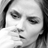

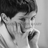

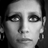

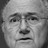

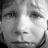

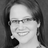

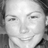

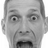

In [ ]:
#transformando cada imagem para o formato de numpy array

largura, altura = 48, 48
faces = []
amostras = 0
for pixel_sequence in pixels:
  face = [int(pixel) for pixel in pixel_sequence.split(' ')]
  face = np.asarray(face).reshape(largura, altura)
  faces.append(face)

  if (amostras < 10):
    cv2_imshow(face)
  amostras += 1

In [ ]:
print('Número total de imagens no dataset: ', str(len(faces)))

Número total de imagens no dataset:  35887


In [ ]:
#transformando faces para o formato numpy array

faces = np.asarray(faces)

In [ ]:
faces.shape

(35887, 48, 48)

In [ ]:
#adicionando mais uma dimensão

faces = np.expand_dims(faces, -1)
faces.shape

(35887, 48, 48, 1)

In [ ]:
#função para normalizar as imagens

def normalizar(x):
  x = x.astype('float32')
  x = x / 255.0
  return x

In [ ]:
faces = normalizar(faces)

In [ ]:
faces[0]

array([[[0.27450982],
        [0.3137255 ],
        [0.32156864],
        ...,
        [0.20392157],
        [0.16862746],
        [0.16078432]],

       [[0.25490198],
        [0.23921569],
        [0.22745098],
        ...,
        [0.21960784],
        [0.20392157],
        [0.17254902]],

       [[0.19607843],
        [0.16862746],
        [0.21176471],
        ...,
        [0.19215687],
        [0.21960784],
        [0.18431373]],

       ...,

       [[0.35686275],
        [0.25490198],
        [0.16470589],
        ...,
        [0.28235295],
        [0.21960784],
        [0.16862746]],

       [[0.3019608 ],
        [0.32156864],
        [0.30980393],
        ...,
        [0.4117647 ],
        [0.27450982],
        [0.18039216]],

       [[0.3019608 ],
        [0.28235295],
        [0.32941177],
        ...,
        [0.41568628],
        [0.42745098],
        [0.32156864]]], dtype=float32)

In [ ]:
#transformando para o formato one hot encoded

emocoes = pd.get_dummies(data['emotion']).values

In [ ]:
emocoes[0]

array([1, 0, 0, 0, 0, 0, 0], dtype=uint8)

## Etapa 5 - Imports do Tensorflow/Keras

In [ ]:
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten
from tensorflow.keras.layers import Conv2D, MaxPooling2D, BatchNormalization
from tensorflow.keras.losses import categorical_crossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
from tensorflow.keras.models import load_model
from tensorflow.keras.models import model_from_json

## Etapa 6 - Dividir em conjuntos para treinamento e validação

In [ ]:
#dividindo em conjuntos de treino e teste

X_train, X_test, y_train, y_test = train_test_split(faces, emocoes, test_size = 0.1, random_state = 42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size = 0.1, random_state = 41)

In [ ]:
print('Número de imagens no conjunto de treinamento:', len(X_train))
print('Número de imagens no conjunto de teste:', len(X_test))
print('Número de imagens no conjunto de validação:', len(X_val))

Número de imagens no conjunto de treinamento: 29068
Número de imagens no conjunto de teste: 3589
Número de imagens no conjunto de validação: 3230


In [ ]:
np.save('mod_xtest', X_test)
np.save('mod_ytest', y_test)

## Etapa 7 - Arquitetura do Modelo (CNN)

### Arquitetura 1 do modelo

Padding same x valid: https://www.corvil.com/kb/what-is-the-difference-between-same-and-valid-padding-in-tf-nn-max-pool-of-tensorflow

Implementação original: https://medium.com/@birdortyedi_23820/deep-learning-lab-episode-3-fer2013-c38f2e052280

Regularizers: https://keras.io/regularizers/

Dropout: http://jmlr.org/papers/volume15/srivastava14a.old/srivastava14a.pdf


In [ ]:
#criando a arquitetura da rede neural

num_features = 64
num_labels = 7
batch_size = 64
epochs = 100
width, height = 48, 48

model = Sequential()

#camada de convolução
model.add(Conv2D(num_features, kernel_size=(3,3), activation='relu',
                 input_shape=(width, height, 1), data_format = 'channels_last',
                 kernel_regularizer = l2(0.01)))
#camada de convolução
model.add(Conv2D(num_features, kernel_size=(3,3), activation='relu', padding='same'))
#camada de normalização
model.add(BatchNormalization())
#camada de pooling
model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))
#camada de dropout
model.add(Dropout(0.5))

model.add(Conv2D(2*num_features, kernel_size=(3,3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(Conv2D(2*num_features, kernel_size=(3,3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))
model.add(Dropout(0.5))

model.add(Conv2D(2*2*num_features, kernel_size=(3,3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(Conv2D(2*2*num_features, kernel_size=(3,3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))
model.add(Dropout(0.5))

model.add(Conv2D(2*2*2*num_features, kernel_size=(3,3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(Conv2D(2*2*2*num_features, kernel_size=(3,3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))
model.add(Dropout(0.5))

#aplicando o flattening
model.add(Flatten())

#camadas densas
model.add(Dense(2*2*2*num_features, activation='relu'))
model.add(Dropout(0.4))
model.add(Dense(2*2*num_features, activation='relu'))
model.add(Dropout(0.4))
model.add(Dense(2*num_features, activation='relu'))
model.add(Dropout(0.5))

model.add(Dense(num_labels, activation = 'softmax'))

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 46, 46, 64)        640       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 46, 46, 64)        36928     
_________________________________________________________________
batch_normalization (BatchNo (None, 46, 46, 64)        256       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 23, 23, 64)        0         
_________________________________________________________________
dropout (Dropout)            (None, 23, 23, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 23, 23, 128)       73856     
_________________________________________________________________
batch_normalization_1 (Batch (None, 23, 23, 128)       5

## Etapa 8 - Compilando o modelo

Parâmetros Adam: https://arxiv.org/abs/1412.6980

Artigo Adam: https://machinelearningmastery.com/adam-optimization-algorithm-for-deep-learning/

beta: Taxa de decaimento exponencial (por exemplo, 0.9)

In [ ]:
#compilando o modelo

model.compile(loss = 'categorical_crossentropy',
              optimizer = Adam(lr = 0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-7),
              metrics = ['accuracy'])

#criando os arquivos para salvar o modelo após o treinamento
arquivo_modelo = 'modelo_01_expressoes.h5'
arquivo_modelo_json = 'modelo_01_expressoes.json'

#funções de callback

#altera a taxa de aprendizagem durante o treinamento se necessário
lr_reducer = ReduceLROnPlateau(monitor='val_loss', factor = 0.9, patience=3, verbose = 1)
#interrompe o treinamento antes de terminarem as épocas se necessário
early_stopper = EarlyStopping(monitor='val_loss', min_delta=0, patience = 8, verbose = 1, mode = 'auto')
#salva o melhor modelo durante o treinamento
checkpointer = ModelCheckpoint(arquivo_modelo, monitor='val_loss', verbose = 1, save_best_only=True)

### Salvando a arquitetura do modelo em um arquivo JSON

In [ ]:
#salvando a arquitetura do modelo no arquivo json

model_json = model.to_json()
with open(arquivo_modelo_json, 'w') as json_file:
  json_file.write(model_json)

## Etapa 9 - Treinando o modelo

In [ ]:
history = model.fit(np.array(X_train), np.array(y_train),
                    batch_size = batch_size,
                    epochs = epochs,
                    verbose = 1,
                    validation_data = (np.array(X_val), np.array(y_val)),
                    shuffle=True,
                    callbacks=[lr_reducer, early_stopper, checkpointer])

Train on 29068 samples, validate on 3230 samples
Epoch 1/100
29056/29068 [============================>.] - ETA: 0s - loss: 1.9828 - accuracy: 0.2172
Epoch 00001: val_loss improved from inf to 1.81968, saving model to modelo_01_expressoes.h5
29068/29068 [==============================] - 55s 2ms/sample - loss: 1.9828 - accuracy: 0.2172 - val_loss: 1.8197 - val_accuracy: 0.2594
Epoch 2/100
29056/29068 [============================>.] - ETA: 0s - loss: 1.8347 - accuracy: 0.2459
Epoch 00002: val_loss did not improve from 1.81968
29068/29068 [==============================] - 47s 2ms/sample - loss: 1.8347 - accuracy: 0.2458 - val_loss: 1.9298 - val_accuracy: 0.1749
Epoch 3/100
29056/29068 [============================>.] - ETA: 0s - loss: 1.7934 - accuracy: 0.2662
Epoch 00003: val_loss did not improve from 1.81968
29068/29068 [==============================] - 47s 2ms/sample - loss: 1.7933 - accuracy: 0.2662 - val_loss: 1.8442 - val_accuracy: 0.2635
Epoch 4/100
29056/29068 [===============

In [ ]:
print(history.history)

{'loss': [1.982774208759005, 1.834678174951668, 1.7933281262606295, 1.6999560246789769, 1.5932933361802286, 1.5159060812167064, 1.4567634121692867, 1.4159550690595166, 1.376296598448359, 1.3380471714690905, 1.3032370696488413, 1.2815921401426358, 1.2508541366757726, 1.2256343772851963, 1.208272742670636, 1.1831267962876353, 1.1677519620916645, 1.136265757537633, 1.1205457950763695, 1.1151067882353853, 1.080671880019487, 1.0663295759366667, 1.0431954929584877, 1.0292568410199134, 1.0057521800941067, 0.9904360655365578, 0.9722435331515208, 0.9520802978916806, 0.9380389674831588, 0.91643436128604, 0.893538383287955, 0.8777271464223037, 0.8596494569974636, 0.8318544923192913, 0.811953007904227], 'accuracy': [0.21721481, 0.24583735, 0.26616898, 0.31605202, 0.37900785, 0.4059791, 0.42971653, 0.4553805, 0.47096464, 0.49394524, 0.5055043, 0.5146897, 0.53343886, 0.54327786, 0.55335766, 0.5639879, 0.572726, 0.5824274, 0.59137195, 0.58996147, 0.6036879, 0.6116348, 0.6198225, 0.6249828, 0.6354066,

## Gerando gráfico da melhora em cada etapa do treinamento

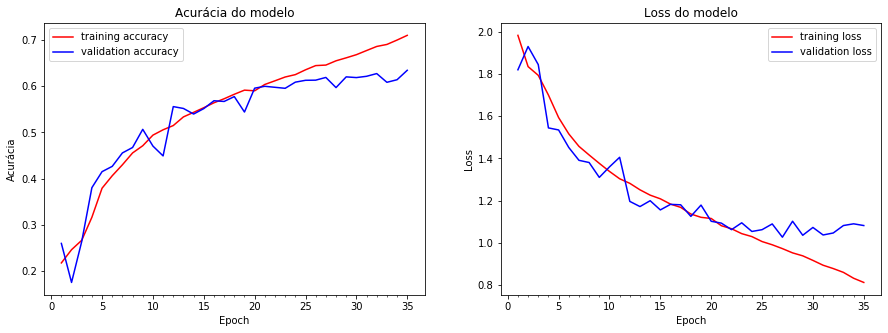

In [ ]:
#plotando os gráficos para análise

def plota_historico_modelo(historico_modelo):
  fig, axs = plt.subplots(1, 2, figsize=(15,5))
  axs[0].plot(range(1, len(historico_modelo.history['accuracy']) + 1), historico_modelo.history['accuracy'], 'r')
  axs[0].plot(range(1, len(historico_modelo.history['val_accuracy']) + 1), historico_modelo.history['val_accuracy'], 'b')
  axs[0].set_title('Acurácia do modelo')
  axs[0].set_ylabel('Acurácia')
  axs[0].set_xlabel('Epoch')
  axs[0].set_xticks(np.arange(1, len(historico_modelo.history['accuracy']) + 1),
                    len(historico_modelo.history['accuracy']) / 10)
  axs[0].legend(['training accuracy', 'validation accuracy'], loc = 'best')

  axs[1].plot(range(1, len(historico_modelo.history['loss']) + 1), historico_modelo.history['loss'], 'r')
  axs[1].plot(range(1, len(historico_modelo.history['val_loss']) + 1), historico_modelo.history['val_loss'], 'b')
  axs[1].set_title('Loss do modelo')
  axs[1].set_ylabel('Loss')
  axs[1].set_xlabel('Epoch')
  axs[1].set_xticks(np.arange(1, len(historico_modelo.history['loss']) + 1),
                    len(historico_modelo.history['loss']) / 10)
  axs[1].legend(['training loss', 'validation loss'], loc = 'best')
  fig.savefig('historico_modelo_mod01.png')

plota_historico_modelo(history)

### Verificando a acurácia do modelo

In [ ]:
#aplicando o modelo no conjunto de teste
scores = model.evaluate(np.array(X_test), np.array(y_test), batch_size = batch_size)

3589/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

In [ ]:
scores

[1.1469147179611017, 0.61799943]

In [ ]:
print('Acurácia: ' + str(scores[1]))
print('Erro: ' + str(scores[0]))

Acurácia: 0.61799943
Erro: 1.1469147179611017


## Carregamento dos dados para gerar a matriz de confusão

In [ ]:
true_y = []
pred_y = []
#carregando os arquivos salvos anteriromente no formato numpy
x = np.load('mod_xtest.npy')
y = np.load('mod_ytest.npy')

In [ ]:
x[0]

array([[[0.5568628 ],
        [0.5803922 ],
        [0.59607846],
        ...,
        [0.3529412 ],
        [0.3529412 ],
        [0.3647059 ]],

       [[0.5568628 ],
        [0.5764706 ],
        [0.5921569 ],
        ...,
        [0.33333334],
        [0.36078432],
        [0.40392157]],

       [[0.5529412 ],
        [0.5686275 ],
        [0.5921569 ],
        ...,
        [0.3372549 ],
        [0.32156864],
        [0.37254903]],

       ...,

       [[0.0627451 ],
        [0.08235294],
        [0.07058824],
        ...,
        [0.08235294],
        [0.09019608],
        [0.11372549]],

       [[0.05490196],
        [0.0627451 ],
        [0.05490196],
        ...,
        [0.07450981],
        [0.07843138],
        [0.09803922]],

       [[0.04705882],
        [0.04705882],
        [0.04705882],
        ...,
        [0.06666667],
        [0.07450981],
        [0.09411765]]], dtype=float32)

In [ ]:
y[0]

array([0, 0, 0, 1, 0, 0, 0], dtype=uint8)

In [ ]:
#carregando o modelo salvo
json_file = open(arquivo_modelo_json, 'r')
loaded_model_json = json_file.read()
json_file.close()

In [ ]:
#transformando para um modelo do Tensorflow
loaded_model = model_from_json(loaded_model_json)
loaded_model.load_weights(arquivo_modelo)

In [ ]:
#fazendo as previsões
y_pred = loaded_model.predict(x)

In [ ]:
y_pred[0]

array([1.0268885e-03, 7.2481704e-08, 1.2463327e-03, 9.7416526e-01,
       8.9820026e-04, 2.3455783e-03, 2.0317785e-02], dtype=float32)

In [ ]:
#transformando para lista
yp = y_pred.tolist()
yt = y.tolist()
count = 0

In [ ]:
len(y)

3589

In [ ]:
#calculando manualmente a acurácia

for i in range(len(y)):
  yy = max(yp[i])
  yyt = max(yt[i])
  pred_y.append(yp[i].index(yy))
  true_y.append(yt[i].index(yyt))
  if (yp[i].index(yy) == yt[i].index(yyt)):
    count += 1

acc = (count / len(y)) * 100

In [ ]:
print('Acurácia no conjunto de teste: ' + str(acc))

Acurácia no conjunto de teste: 61.79994427417108


In [ ]:
#salvando os valores verdadeiros e previstos

np.save('truey_mod01', true_y)
np.save('predy_mod01', pred_y)

## Gerando a Matriz de Confusão

In [ ]:
from sklearn.metrics import confusion_matrix

In [ ]:
y_true = np.load('truey_mod01.npy')
y_pred = np.load('predy_mod01.npy')

In [ ]:
#matriz de confusão

cm = confusion_matrix(y_true, y_pred)
expressoes = ['Raiva', 'Nojo', 'Medo', 'Feliz', 'Triste', 'Surpreso', 'Neutro']
titulo = 'Matriz de Confusão'
print(cm)

[[252   0  23  22  82  13 106]
 [ 37   0   1   1  11   2   0]
 [ 79   0 135  24 143  75  89]
 [ 30   0   3 744  30  20  54]
 [ 35   0  14  34 321   4 180]
 [ 15   0  26  32  13 306  22]
 [ 22   0   6  44  73   6 460]]


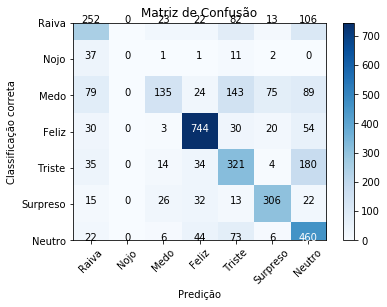

In [ ]:
#gerando um gráfico com a matriz de confusão

import itertools
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title(titulo)
plt.colorbar()
tick_marks = np.arange(len(expressoes))
plt.xticks(tick_marks, expressoes, rotation = 45)
plt.yticks(tick_marks, expressoes)
fmt = 'd'
thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
  plt.text(j, i, format(cm[i, j], fmt), horizontalalignment='center', color='white' if cm[i,j] > thresh else 'black')

plt.ylabel('Classificação correta')
plt.xlabel('Predição')
plt.savefig('matriz_confusao_mod01.png')

## Testando o modelo

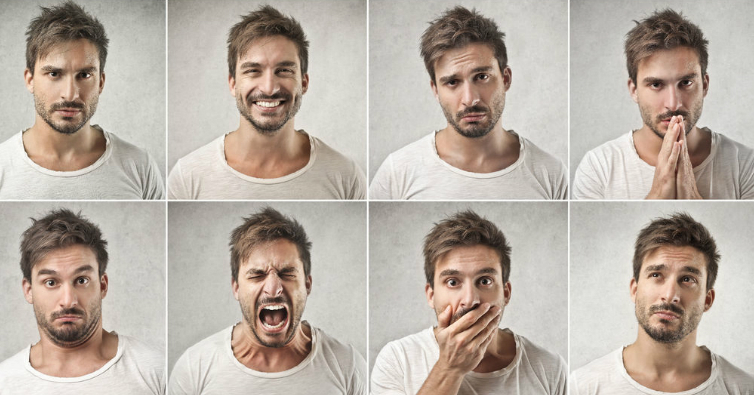

In [ ]:
#pegando uma imagem para teste

imagem = cv2.imread('Material/testes/teste02.jpg')
cv2_imshow(imagem)

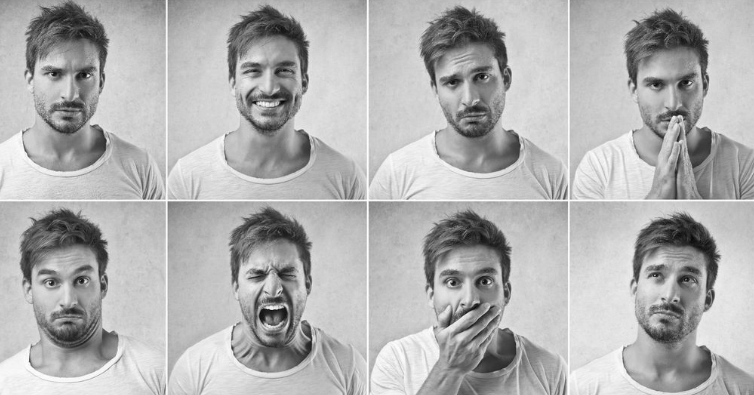

In [ ]:
#convertendo para escala de cinza

original = imagem.copy()
gray = cv2.cvtColor(original, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)

In [ ]:
#utilizando o detector de faces

face_cascade = cv2.CascadeClassifier('Material/haarcascade_frontalface_default.xml')
faces = face_cascade.detectMultiScale(gray, 1.1, 3)

In [ ]:
faces

array([[224,  35,  90,  90],
       [625,  49,  91,  91],
       [ 23,  41,  92,  92],
       [420,  43,  97,  97],
       [420, 242,  97,  97],
       [ 18, 243,  98,  98],
       [229, 242,  85,  85],
       [627, 241,  91,  91]], dtype=int32)

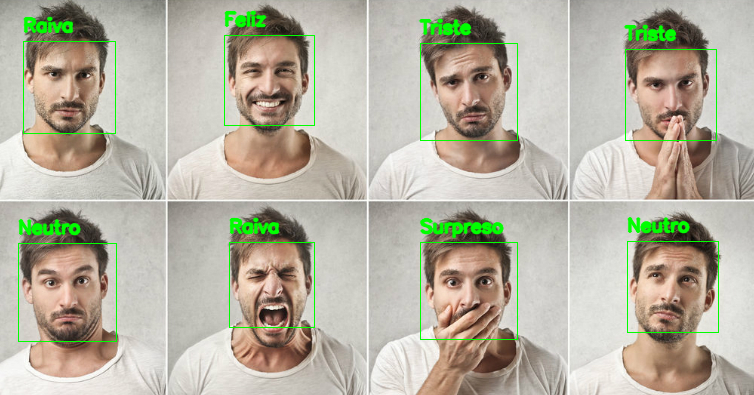

In [ ]:
#desenhando os retângulos e escrevendo a emoção prevista

for (x, y, w, h) in faces:
  cv2.rectangle(original, (x, y), (x + w, y + h), (0, 255, 0), 1)
  roi_gray = gray[y:y + h, x:x + w]
  roi_gray = roi_gray.astype('float') / 255.0
  cropped_img = np.expand_dims(np.expand_dims(cv2.resize(roi_gray, (48, 48)), -1), 0)
  prediction = loaded_model.predict(cropped_img)[0]
  cv2.putText(original, expressoes[int(np.argmax(prediction))], (x, y - 10),
              cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2, cv2.LINE_AA)

cv2_imshow(original)